### Global Market Clusteing

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import time
import random
import datetime
from datetime import date
from datetime import timedelta
from dateutil.relativedelta import relativedelta
import pickle
import seaborn as sn
import os
os.chdir('../')

from src.test_pipeline import test_pipeline
from src.test_pipeline import test_rolling
from src.test_pipeline import random_test
from src.test_pipeline import Hierarchical_Computing

plt.rcParams["figure.figsize"] = (18,5)

In [103]:
dfs = []
names = []
for counter,df in enumerate(os.listdir("data/global_market")):
    names.append(df.split("_data.csv")[0])
    dfs.append(pd.read_csv(f"data/global_market/{df}"))
    try:
        dfs[counter]["Date"] = pd.to_datetime(dfs[counter]["Date"])
        dfs[counter].set_index("Date",inplace=True)
    except:
        print(f"Dataframe {counter}: '{df}' doesn't have Date column")
        dfs[counter] = dfs[counter].rename(columns={"Unnamed: 0": "Index"})
        dfs[counter].set_index("Index",inplace=True)

names.pop(19)
names.pop(-1)

column_names = []
terminations = ["12M","6M","3M","2M","1M"]
for i in names:
    for j in terminations:
        column_names.append(i+"_"+j)


Dataframe 19: 'gdp_world_6regions_data.csv' doesn't have Date column


In [427]:
Regions = dfs[19].Region.unique()
dfs[19].loc[dfs[19].Region=="United States"]


,Region,Currency,Year,GDP
Index,,,,
84,United States,USD,2000,1.025235e+13
85,United States,USD,2001,1.058182e+13
86,United States,USD,2002,1.093642e+13
87,United States,USD,2003,1.145824e+13
88,United States,USD,2004,1.221373e+13
89,United States,USD,2005,1.303664e+13
90,United States,USD,2006,1.381461e+13
91,United States,USD,2007,1.445186e+13
92,United States,USD,2008,1.471284e+13


In [403]:
#Visualize nans

nan_dfs = []
for counter,i in enumerate(df.isna().sum()):
    if i > 0:
        print(counter)
        df.iloc[:,counter]
        nan_dfs.append(counter)




11
12
13
14
16
17
18
19
26
27
28
29
36
37
38
39
40
41
42
43
44
51
52
53
54


In [417]:
df.iloc[:,nan_dfs[22]]

0     0.533990
1     0.389604
2     0.760198
3     0.626495
4     1.408701
        ...   
50         NaN
51         NaN
52         NaN
53         NaN
54         NaN
Name: commodity_Silver_3M, Length: 55, dtype: float64

In [354]:
df.iloc[:,11]

0         NaN
1   -0.022375
2   -0.046922
Name: bond_France_5Y_6M, dtype: float64

In [358]:
df

,bond_Canada_5Y_12M,bond_Canada_5Y_6M,bond_Canada_5Y_3M,bond_Canada_5Y_2M,bond_Canada_5Y_1M,bond_China_5Y_12M,bond_China_5Y_6M,bond_China_5Y_3M,bond_China_5Y_2M,bond_China_5Y_1M,...,index_world_MSCIWorldUtilities_12M,index_world_MSCIWorldUtilities_6M,index_world_MSCIWorldUtilities_3M,index_world_MSCIWorldUtilities_2M,index_world_MSCIWorldUtilities_1M,index_world_MSCIWorld_12M,index_world_MSCIWorld_6M,index_world_MSCIWorld_3M,index_world_MSCIWorld_2M,index_world_MSCIWorld_1M
0,1.718859,1.428339,1.360328,1.308738,1.385333,3.081205,3.050845,2.966054,2.935714,2.945575,...,134.963149,139.905909,142.320149,143.034886,145.378409,2087.670286,2152.180833,2168.825149,2150.762045,2180.261136
1,1.637004,1.410141,1.364070,1.428500,1.466652,3.052767,3.024226,2.963742,2.984087,3.022600,...,136.796584,141.729474,144.414254,146.234333,147.074375,2097.164160,2157.895940,2163.433209,2184.049778,2187.026667
2,1.567861,1.401844,1.454839,1.488274,1.511300,3.031407,3.003262,2.999158,3.025950,3.033452,...,138.169385,143.123462,145.717308,145.928750,144.723571,2117.019385,2183.675423,2212.179231,2227.228409,2273.874048


In [393]:
for j,i in enumerate(dfs):
    print(i.index[0],j)

2000-01-04 00:00:00 0
2001-03-14 00:00:00 1
2000-01-03 00:00:00 2
2000-01-01 00:00:00 3
2000-01-03 00:00:00 4
2000-01-03 00:00:00 5
2006-07-27 00:00:00 6
2000-01-01 00:00:00 7
2000-01-03 00:00:00 8
2000-01-04 00:00:00 9
2000-01-04 00:00:00 10
2000-01-04 00:00:00 11
2000-01-03 00:00:00 12
2000-01-03 00:00:00 13
2000-01-03 00:00:00 14
2000-01-03 00:00:00 15
2000-01-04 00:00:00 16
2000-01-03 00:00:00 17
2000-01-03 00:00:00 18
0 19
2011-04-29 00:00:00 20
2013-05-30 00:00:00 21
2011-10-06 00:00:00 22
2010-05-17 00:00:00 23
2000-01-03 00:00:00 24
2006-01-04 00:00:00 25
2000-01-03 00:00:00 26
2000-01-03 00:00:00 27
2000-01-03 00:00:00 28
2012-09-20 00:00:00 29
2012-07-09 00:00:00 30
2012-07-09 00:00:00 31
2012-07-09 00:00:00 32
2012-07-09 00:00:00 33
2012-07-09 00:00:00 34
2012-11-06 00:00:00 35
2012-07-09 00:00:00 36
2012-07-09 00:00:00 37
2012-07-09 00:00:00 38
2012-07-09 00:00:00 39
2012-07-09 00:00:00 40
2012-07-09 00:00:00 41
2012-07-09 00:00:00 42
2012-07-09 00:00:00 43
2012-07-09 00:00

In [185]:
dfs[0]["2014-05-01":"2014-06-01"]["Average"].mean()

1.5944800000000001

In [382]:
def calculate_cluster_variables(start,end,colnames,dfs,verbose=False): 

    start_date = date.fromisoformat(start)
    end_date = date.fromisoformat(end)

    num_months = (end_date.year - start_date.year) * 12 + (end_date.month - start_date.month)
    clustering_df = pd.DataFrame(columns=colnames)
    
    for rows in range(num_months+1):
        start_date_offset = start_date + relativedelta(months=rows)
        if verbose:
            print(start_date_offset)
        row = []
        for df in dfs:
            offsets = [12,6,3,2,1]
            for offset in offsets:
                offset_date = start_date_offset - relativedelta(months=offset)
                try:
                    row.append(df[offset_date.isoformat():start_date_offset.isoformat()]["Average"].var())
                except:
                    break
                
        clustering_df.loc[len(clustering_df)] = row
    
    return clustering_df
        


In [429]:
df = calculate_cluster_variables(start="2016-06-01",end="2017-12-01",colnames=column_names,dfs=dfs,verbose=False)

In [384]:
df

,bond_Canada_5Y_12M,bond_Canada_5Y_6M,bond_Canada_5Y_3M,bond_Canada_5Y_2M,bond_Canada_5Y_1M,bond_China_5Y_12M,bond_China_5Y_6M,bond_China_5Y_3M,bond_China_5Y_2M,bond_China_5Y_1M,...,index_world_MSCIWorldUtilities_12M,index_world_MSCIWorldUtilities_6M,index_world_MSCIWorldUtilities_3M,index_world_MSCIWorldUtilities_2M,index_world_MSCIWorldUtilities_1M,index_world_MSCIWorld_12M,index_world_MSCIWorld_6M,index_world_MSCIWorld_3M,index_world_MSCIWorld_2M,index_world_MSCIWorld_1M
0,0.020753,0.011966,0.004306,0.004962,0.002437,0.131410,0.027608,0.006309,0.003812,0.001146,...,24.229652,22.772526,3.381158,0.905448,0.480111,6040.783334,987.011326,297.326689,266.722331,103.844547
1,0.020863,0.008889,0.004542,0.001530,0.000666,0.092075,0.038742,0.014519,0.009308,0.000524,...,30.778234,23.685739,3.762366,3.297054,2.005493,5690.299527,1444.732202,827.621267,540.074820,113.652682
2,0.025159,0.005858,0.002666,0.002191,0.002456,0.054753,0.022542,0.007526,0.006881,0.004169,...,34.225952,13.889685,2.743753,1.671977,1.582892,5270.373862,1822.439547,641.719266,161.770946,137.139222
3,0.026352,0.006664,0.002005,0.001702,0.000817,0.043791,0.013355,0.005751,0.002313,0.000183,...,31.895990,6.296549,4.638492,4.885365,2.557546,4232.583268,1173.999680,329.368796,438.737968,470.853065
4,0.015137,0.005966,0.005742,0.006322,0.002529,0.042883,0.007875,0.002156,0.001030,0.001673,...,27.683827,3.716081,4.001347,2.208281,1.671010,3245.773347,895.157698,400.095658,399.781641,318.251149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38,0.064575,0.035235,0.060492,0.055395,0.005535,0.161890,0.062691,0.006159,0.001642,0.000826,...,28.576269,18.327514,5.291713,3.399264,2.267071,7334.203072,2066.147288,531.729219,287.117396,408.736008
39,0.070577,0.052271,0.046612,0.003020,0.000947,0.165889,0.053991,0.002121,0.002020,0.000518,...,38.158258,15.319684,4.941990,6.881835,1.036104,8247.860213,1806.710596,312.679670,296.052583,163.154085
40,0.088787,0.091521,0.016651,0.015997,0.006365,0.152481,0.022692,0.001928,0.000371,0.000157,...,46.304513,11.998868,6.980510,1.820327,2.667757,8811.147866,1825.406903,516.617567,387.378621,178.763621
41,0.087893,0.089149,0.012872,0.004680,0.002446,0.128994,0.009060,0.007593,0.009350,0.009536,...,49.066136,7.788437,1.903243,2.404879,1.983069,9185.547336,1870.833027,1086.069054,625.600828,109.657328


In [321]:
# Correlation matrix

plt.rcParams['figure.figsize'] = 160,160
corrMatrix = df.corr()
sn.heatmap(corrMatrix, annot=True)
plt.show()

In [430]:
from sklearn.preprocessing import StandardScaler

normalizer = StandardScaler()

normalizer.fit(df)
df_normalized = normalizer.transform(df)


In [431]:
from sklearn.decomposition._pca import PCA

pca = PCA(n_components=2)
pca.fit(df_normalized)
df_pca = pca.transform(df_normalized)

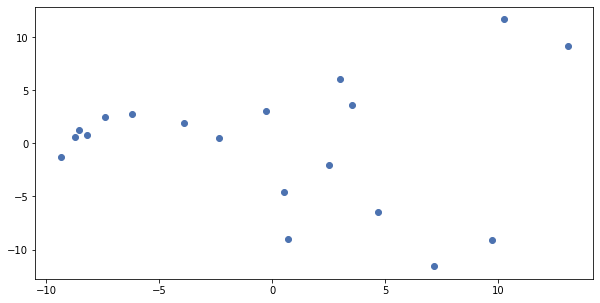

In [432]:
plt.rcParams['figure.figsize'] = 10,5
plt.scatter(df_pca[:,0],df_pca[:,1])

C:\Users\Davimen\anaconda3\envs\downgrade\lib\site-packages\sklearn\cluster\_kmeans.py:1039: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


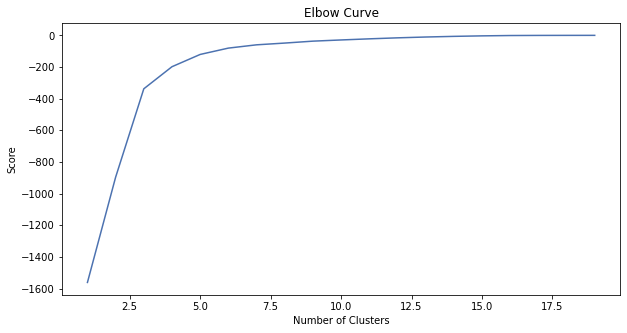

In [433]:
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min

Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(df_pca).score(df_pca) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [434]:
kmeans = KMeans(n_clusters=5).fit(df_pca)
centroids = kmeans.cluster_centers_
print(centroids)

[[ 11.65874519  10.45879313]
 [ -6.84360748   1.14340291]
 [  2.08588354  -5.54098548]
 [  2.0746729    4.27926395]
 [  8.4319083  -10.36932972]]


In [435]:
# Predicting the clusters
labels = kmeans.predict(df_pca)
# Getting the cluster centers
C = kmeans.cluster_centers_
colores=['red','green','blue','cyan','black']
asignar=[]
for row in labels:
    asignar.append(colores[row])


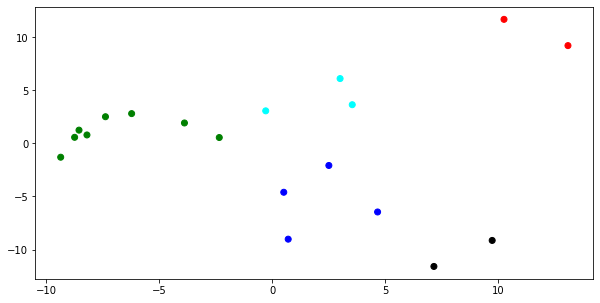

In [436]:
plt.scatter(df_pca[:,0],df_pca[:,1],c=asignar)

In [361]:
labels = kmeans.predict(df_pca)
# Getting the cluster centers
C = kmeans.cluster_centers_
colores=[0,1,2,3,4,5,6,7,8,9]
asignar=[]
for row in labels:
    asignar.append(colores[row])

In [437]:
asignar

['blue',
 'black',
 'black',
 'blue',
 'blue',
 'blue',
 'red',
 'red',
 'cyan',
 'cyan',
 'cyan',
 'green',
 'green',
 'green',
 'green',
 'green',
 'green',
 'green',
 'green']